<a href="https://colab.research.google.com/github/ejgl/uw_junocam/blob/main/NASA_Space_Challenge.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#!pip install astropy
!pip install astroquery
!pip install PDS4_tools-1.3.zip
!pip install Pillow
!pip install httpx
!pip install rich
!pip install pds.api_client

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 4.5 MB 2.0 MB/s 
     |████████████████████████████████| 832 kB 42.3 MB/s 
     |████████████████████████████████| 48 kB 5.5 MB/s 
     |████████████████████████████████| 4.0 MB 36.9 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing ./PDS4_tools-1.3.zip
ERROR: Could not install packages due to an OSError: [Errno 2] No such file or directory: '/content/PDS4_tools-1.3.zip'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 84 kB 1.7 MB/s 
     |████████████████████████████████| 68 kB 4.8 MB/s 
     |████████████████████████████████| 54 kB 2.9 MB/s 
     |████████████████████████████████| 80 kB 6.9 MB/s

# Set up imports

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import httpx
from rich import print
import pds.api_client as pds_api
from pds.api_client.api.bundles_api import BundlesApi

# Testing Imaging Atlas Search API (Querying)

Link to syntax: https://pds-imaging.jpl.nasa.gov/tools/atlas/api/#parameters

Query Request: https://pds-imaging.jpl.nasa.gov/solr/pds_archives/search?instrument=jnc

In [ ]:
import requests

In [ ]:
# TODO list

# plot the orbital path of the Juno space craft (based on start_stop time) 

# query start and stop times 

# plot all available points between start and stop times

# user interaction to press a point to load image for image process

# optional sharing functionality

In [ ]:
response = requests.get('https://pds-imaging.jpl.nasa.gov/solr/pds_archives/search?instrument=jnc&filter=red&filter=green&filter=blue&start_time=[2001-01-01T00:00:00Z]')

NameError: ignored

In [ ]:
resp_dict = response.json()

print(resp_dict)

{'responseHeader': {'zkConnected': True, 'status': 400, 'QTime': 2, 'params': {'filter': ['red', 'green', 'blue'], 'start_time': '[2001-01-01T00:00:00Z]', 'instrument': 'jnc'}}, 'error': {'metadata': ['error-class', 'org.apache.solr.common.SolrException', 'root-error-class', 'org.apache.solr.parser.ParseException'], 'msg': 'org.apache.solr.search.SyntaxError: Cannot parse \'(FILTER:red OR FILTER:green OR FILTER:blue) AND START_TIME:[2001-01-01T00:00:00Z] AND INSTRUMENT:jnc\': Encountered " "]" "] "" at line 1, column 80.\nWas expecting:\n    "TO" ...\n    ', 'code': 400}}


In [ ]:
# 
#all those stop times and get the path for juno (api, (filter, start, stop time) time stuff int the colab, fix that area int he beginning)
# Must Plot orbital path(AU?)
# there will be the path for jupiter, the user will chose the location if 


In [ ]:
url = resp_dict['response']['docs'][0]['ATLAS_DATA_URL']

print(url)


https://pds-imaging.jpl.nasa.gov/data/juno//JNOJNC_0001/DATA/EDR/CRUISE/JNCE_2011238_00C00011_V01.IMG

In [ ]:
# WORK IN PROGRESS - for ease of use
# needs to use astropy.time object 
from astropy.time import Time
def format_time_parameter(y, m, d, h = '00', m = '00', s = '00'):
    # YYYY-MM-DDThh:mm:ss[.fff]
    # default start time range to 1 day
    time = f'{y}'
    t_1 = Time()
    #return f'start_time=[{y}-{m}-{d}T{h}:{m}:{s}Z TO {'

In [ ]:
def download_image(url, file_name):
    '''
    takes a url and saves image at url to local files
    '''

    # Send GET request for image
    response = requests.get(url)

    # Save the image
    if response.status_code == 200:
        with open(file_name, "wb") as f:
            f.write(response.content)
    else:
        print(response.status_code)

In [ ]:
def atlas_query(start_time, fn, n):
  '''
  start_time: formatted start time parameter

  fn: file name for saved images

  n: number of images to save
  '''
  base_url = 'https://pds-imaging.jpl.nasa.gov/solr/pds_archives/search?instrument=jnc&filter=red&filter=green&filter=blue&start_time='

  response = requests.get(base_url + start_time)
  resp_dict = response.json()

  for i in range(n):
    url = resp_dict['response']['docs'][n]['ATLAS_DATA_URL']

    download_image(url, str(n)+'_'+fn)

In [ ]:
atlas_query('[2001-01-01T00:00:00Z TO 2002-01-01T00:00:00Z]', 'check.img', 1)

## Orbital Path Proof of Concept
To convey a unique feature in our solution, we have created a demo of a feature that allows the user to graph the location of JunoCam during a image capture.

Example image: https://www.missionjuno.swri.edu/junocam/processing?id=13920

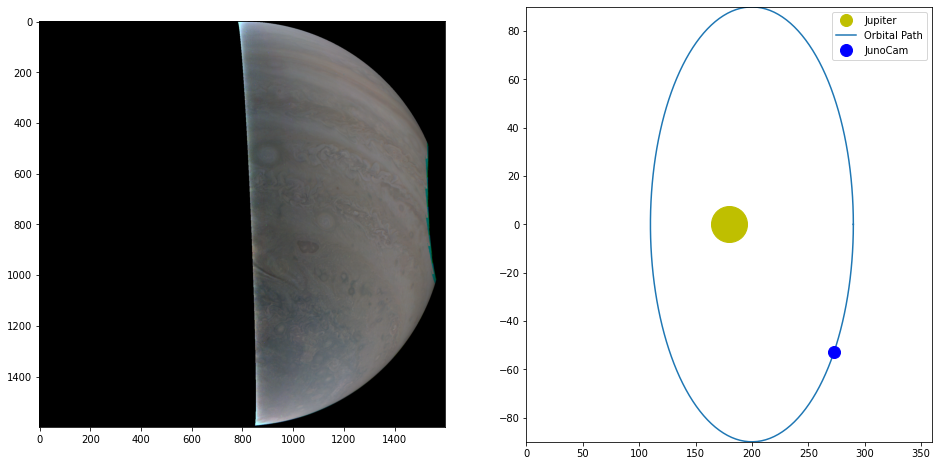

In [ ]:
fig, ax = plt.subplots(1, 2, figsize= (16, 8))
img = Image.open(r"/content/JNCE_2022272_45C00081_V01-mapprojected.png")
img = np.array(img)
ax[0].imshow(img)
ax[1].set_xlim(0, 360)
ax[1].set_ylim(-90, 90)

ax[1].plot(180, 0, 'yo', markersize=36)
ax[1].plot(180, 0, 'yo', markersize=12, label='Jupiter')

angle = np.linspace( 0 , 2 * np.pi , 150 ) 
 
radius = 90
 
x = radius * np.cos( angle ) 
y = radius * np.sin( angle )

ax[1].plot(x+200, y, label = 'Orbital Path')
ax[1].plot(273.0354, -52.7680, 'bo', markersize=12, label='JunoCam')

plt.legend()
plt.show()

# PDS Config

In [ ]:
configuration = pds_api.Configuration()

# demo server
configuration.host = ''

api_client = pds_api.ApiClient(configuration)

In [ ]:
bundles = BundlesApi(api_client)

bundles_response = bundles.get_bundles(q='lidvid eq "urn:nasa:pds:insight_documents::2.0"', fields=["lidvid"])

MaxRetryError: ignored

## Loading LBL files from URL

In [ ]:
# load file from PDS


def load_lbl_file(file_url: str):
    res = httpx.get(file_url)
    output = {}
    file_text = res.text
    for line in file_text.split('\n'):
        line = line.strip()
        if line == '':
            continue
        elif line.strip()[0] == "/":
            continue
        elif line == 'END':
            break
        key, val = line.strip().split('=')
        output[key.strip()] = val.strip()
    return output


demo_lbl = 'https://pds-imaging.jpl.nasa.gov/data/juno/JNOJNC_0010/DATA/EDR/JUPITER/ORBIT_18/JNCE_2019043_18C00001_V01.LBL'
print(load_lbl_file(demo_lbl))

{'PDS_VERSION_ID': 'PDS3', 'RECORD_TYPE': 'FIXED_LENGTH', 'RECORD_BYTES': '1648', 'FILE_RECORDS': '31488', '^IMAGE': '"JNCE_2019043_18C00001_V01.IMG"', 'FILE_NAME': '"JNCE_2019043_18C00001_V01.IMG"', 'SPACECRAFT_NAME': 'JUNO', 'MISSION_PHASE_NAME': '"SCIENCE ORBITS"', 'TARGET_NAME': '"EUROPA"', 'INSTRUMENT_ID': '"JNC"', 'INSTRUMENT_HOST_NAME': '"JUNO"', 'INSTRUMENT_NAME': '"JUNO EPO CAMERA"', 'PRODUCER_ID': 'JUNO_JUNOCAM_TEAM', 'DATA_SET_ID': '"JUNO-J-JUNOCAM-2-EDR-L0-V1.0"', 'STANDARD_DATA_PRODUCT_ID': '"JUNOCAM-EDR"', 'PRODUCT_CREATION_TIME': '2019-04-10T20:36:11', 'PRODUCT_VERSION_ID': '"01"', 'PRODUCT_ID': '"JNCE_2019043_18C00001_V01"', 'SOURCE_PRODUCT_ID': '"3D-0900120001-2019-043T16.19.15"', 'START_TIME': '2019-02-12T07:40:04.384', 'IMAGE_TIME': '2019-02-12T07:40:04.384', 'STOP_TIME': '2019-02-12T07:40:34.806', 'SPACECRAFT_CLOCK_START_COUNT': '"603229478:75"', 'SPACECRAFT_CLOCK_STOP_COUNT': '"N/A"', 'ORBIT_NUMBER': '18', 'SOFTWARE_NAME': '"JUNOMAKEPDS.PY 0.7"', 'PROCESSING_LEVEL_

## Image Processing


https://pds-imaging.jpl.nasa.gov/data/juno/JNOJNC_0006/DATA/EDR/JUPITER/ORBIT_10/

Direct download of raw images from the JunoCam website to user computer/app (Downloading raw images for now)
Image processing features like brightness adjustment, color and contrast enhancement, etc. (In progress)
Instead of the preliminary RGB channel images, consider using raw framelets (striped images) to get the most useful information from JunoCam data
Removal of any existing artifacts created by the strip acquisition process
Alternative combinations of color channel images 
Comparison of original vs. processed images

Like previous MSSS cameras (e.g., Mars Reconnaissance Orbiter’s Mars Color Imager) Junocam is a "pushframe" imager. The detector has multiple filter strips, each with a different bandpass, bonded directly to its photoactive surface. Each strip extends the entire width of the detector, but only a fraction of its height; Junocam's filter strips are 1600 pixels wide and about 155 rows high. The filter strips are scanned across the target by spacecraft rotation. At the nominal spin rate of 2 RPM, frames are acquired about every 400 milliseconds. Junocam has four filters: three visible (red/green/blue) and a narrowband "methane" filter centered at about 890 nm. 

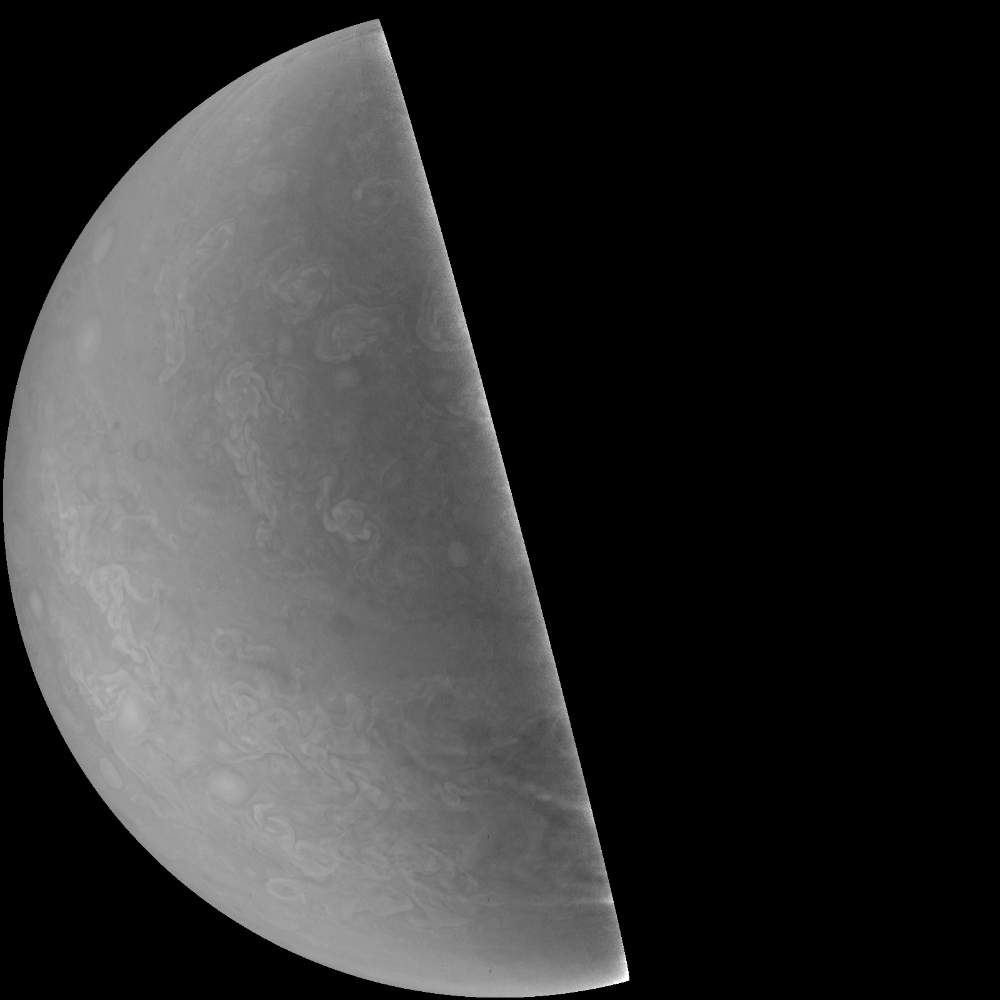

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as img
import cv2
from google.colab.patches import cv2_imshow
#JNCE_2017350_10C00002_V01
# Visualising data
#2017-2018 JunoCam Data - Map Projected (Raw image -> Map Projected image)
original_img = cv2.imread("/content/JNCE_2017086_05C00105_V01-mapprojected.png")
#plt.imshow(im[:,:,0])
(B, G, R) = cv2.split(im)
#im_red = cv2.imread("/content/JNCE_2017086_05C00105_V01-red.png")
#im_blue = cv2.imread("/content/JNCE_2017086_05C00105_V01-blue.png")
#im_green = cv2.imread("/content/JNCE_2017086_05C00105_V01-green.png")
cv2_imshow(B)
#merged = cv2.merge([im_red, im_blue, im_green])
#cv2_imshow(merged)

#Latest JunoCam Data
#im_blue = Image.open(r"/content/JNCE_2022272_45C00088_V01-blue.png")
#im_blue


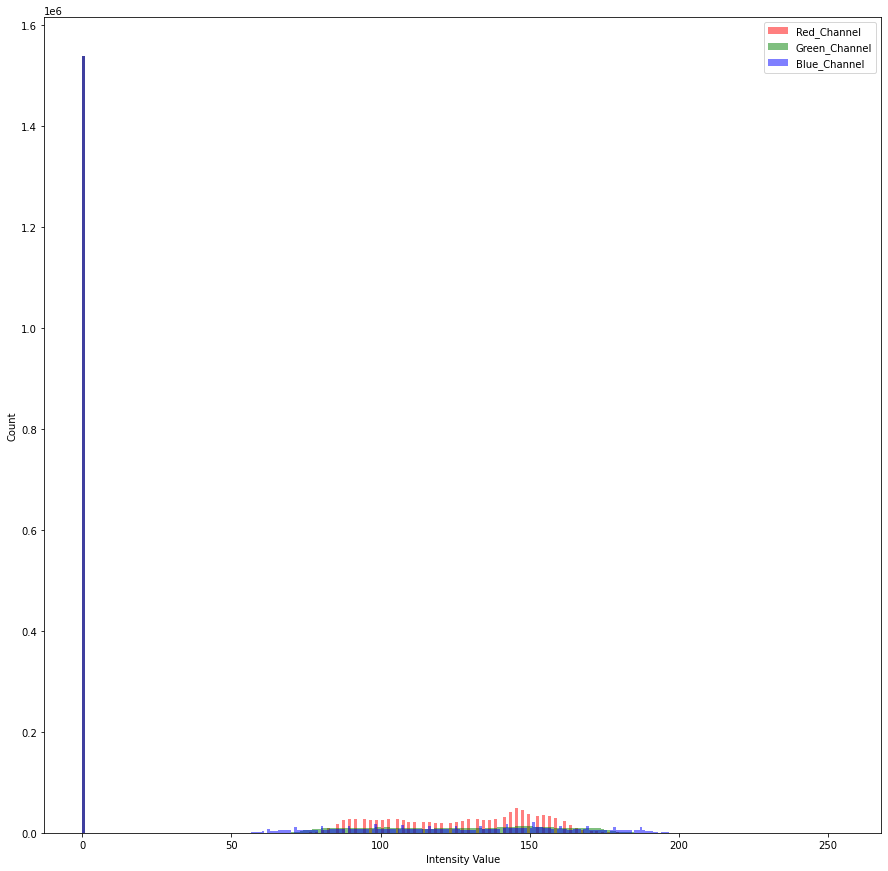

In [ ]:
from skimage import io
import matplotlib.pyplot as plt
f = plt.figure()
f.set_figwidth(15)
f.set_figheight(15)

_ = plt.hist(original_img[:, :, 0].ravel(), bins = 255, color = 'Red', alpha = 0.5)
_ = plt.hist(original_img[:, :, 1].ravel(), bins = 255, color = 'Green', alpha = 0.5)
_ = plt.hist(original_img[:, :, 2].ravel(), bins = 255, color = 'Blue', alpha = 0.5)
_ = plt.xlabel('Intensity Value')
_ = plt.ylabel('Count')
_ = plt.legend(['Red_Channel', 'Green_Channel', 'Blue_Channel'])
plt.show()

A lot of 0 intensity values for the blue band. The red band is by far the most prominent in the image. You can use the sliders below to adjust the denominator of each band in order to see the other bands more clearly.

In [ ]:
# Combine three R, G, B channels and adjust the red channel

@interact(red_factor=(1, 255), green_factor=(1, 255), blue_factor=(1, 255))
def double_number(red_factor=255, green_factor=1, blue_factor=1):
  red = cv2.imread("/content/JNCE_2017086_05C00105_V01-red.png", cv2.IMREAD_GRAYSCALE) 
  green =  cv2.imread("/content/JNCE_2017086_05C00105_V01-blue.png", cv2.IMREAD_GRAYSCALE)
  blue =  cv2.imread("/content/JNCE_2017086_05C00105_V01-green.png", cv2.IMREAD_GRAYSCALE)
  red_norm = red/red_factor
  green_norm = green/green_factor
  blue_norm = blue/blue_factor
  merge_img = np.dstack([red_norm, green_norm, blue_norm]).astype(np.uint8)
  cv2_imshow(merge_img)


interactive(children=(IntSlider(value=255, description='red_factor', max=255, min=1), IntSlider(value=1, descr…

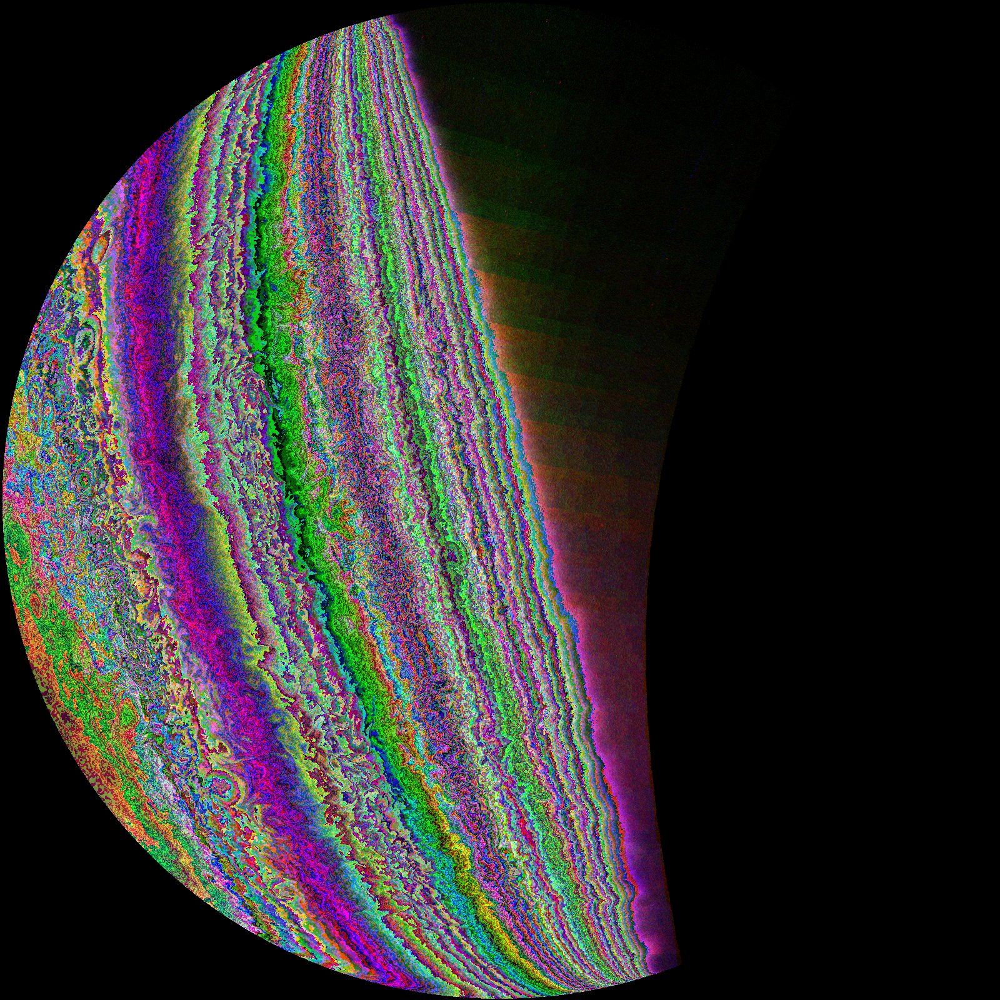

In [ ]:
red = cv2.imread("/content/JNCE_2017086_05C00105_V01-red.png", cv2.IMREAD_GRAYSCALE) 
green =  cv2.imread("/content/JNCE_2017086_05C00105_V01-blue.png", cv2.IMREAD_GRAYSCALE)
blue =  cv2.imread("/content/JNCE_2017086_05C00105_V01-green.png", cv2.IMREAD_GRAYSCALE)
red_norm = red**2
green_norm = green**2
blue_norm = blue**2
merge_img = np.dstack([red_norm, green_norm, blue_norm]).astype(np.uint8)
cv2_imshow(merge_img)

Viola, art and Jupiter's atmosphere clearly indicated with varying colors!

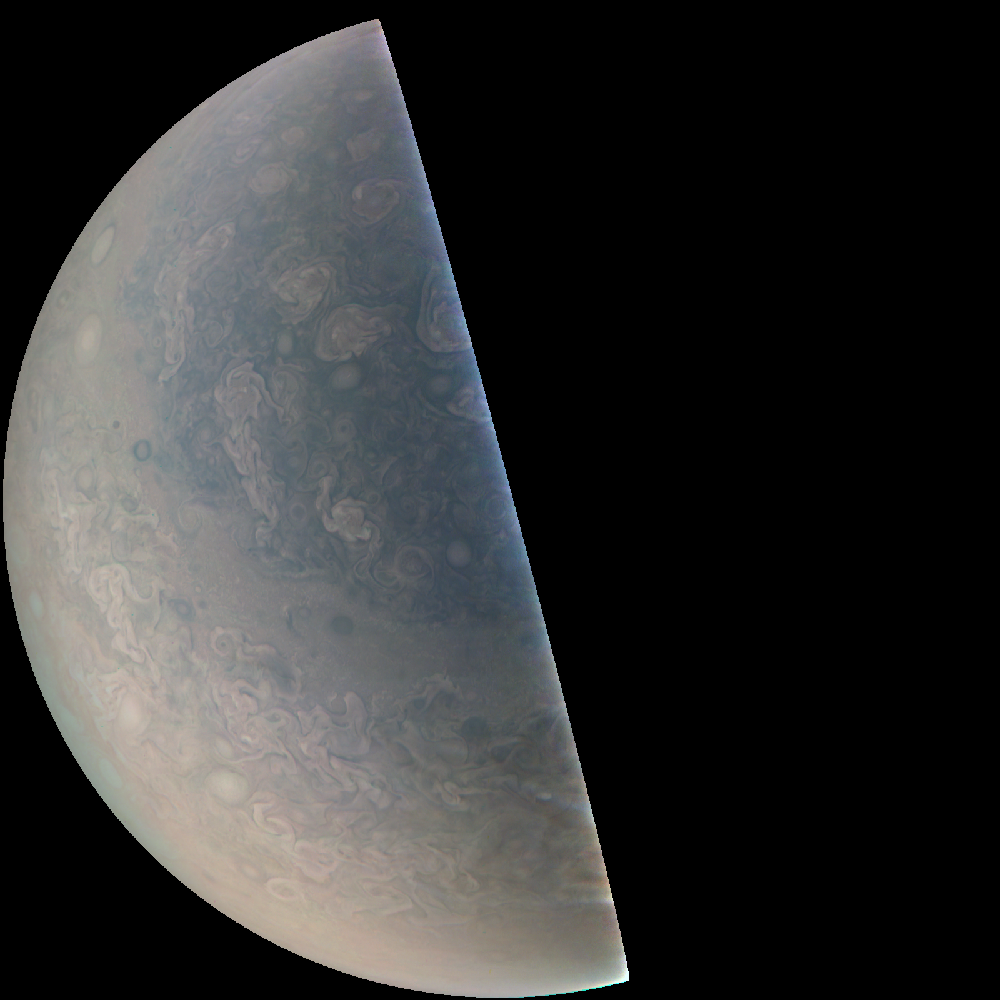

In [ ]:
from PIL import Image, ImageEnhance, ImageFilter
img = Image.open("/content/JNCE_2017086_05C00105_V01-mapprojected.png")
img

filter parameters:

1. A value of 1.0 will preserve the original image
2. Values 1.0+ will brighten the image
3. A value of 0 will return a pitch-black image
4. Values 0.0- will make the image darker

TODO: Have some sort of api in the website to change brightness

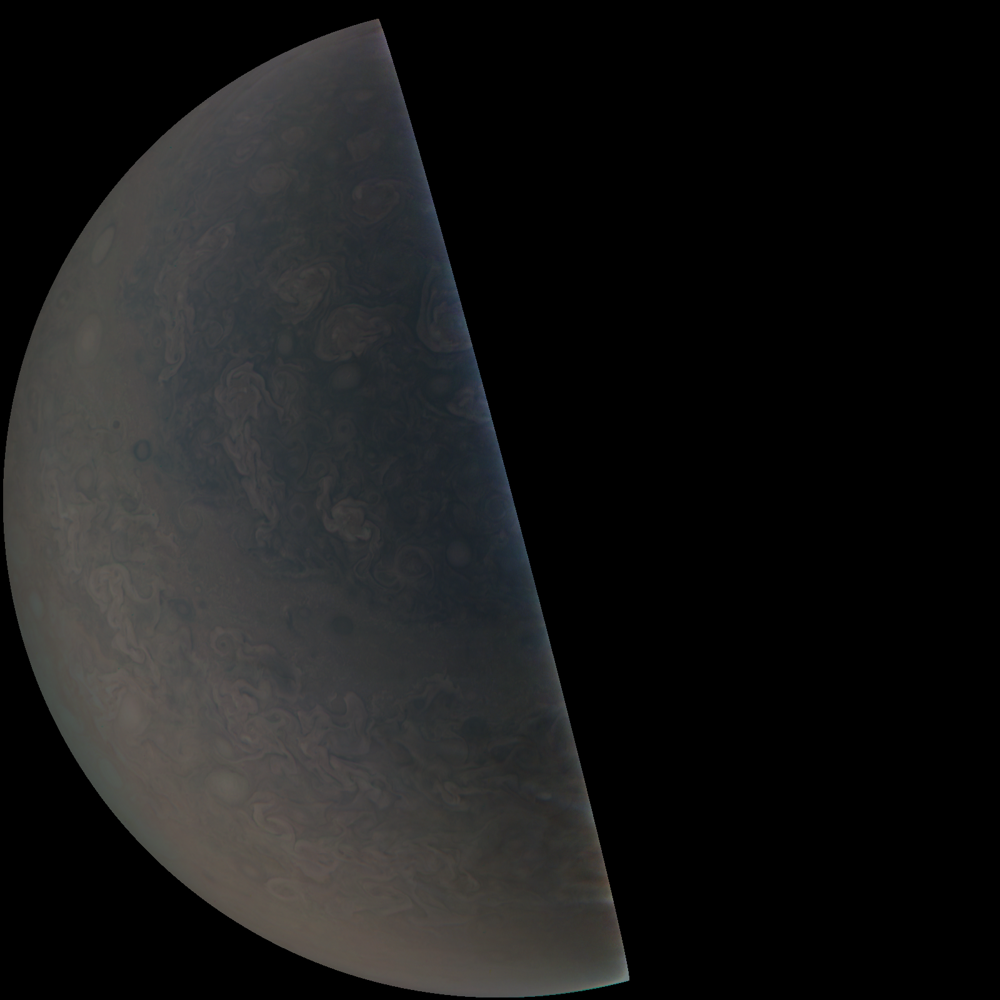

In [ ]:
source = img.split()
R, G, B = 0, 1, 2
brightness_factor = 2 # dim it by a factor of 2
img_red = source[R].point(lambda i: i / brightness_factor)
img_green = source[G].point(lambda i: i / brightness_factor)
img_blue = source[B].point(lambda i: i / brightness_factor)

new_brightness_img = Image.merge(img.mode, (img_red, img_green, img_blue))
new_brightness_img 

Contrast Enhancement
(Histogram Equalization)




/usr/local/lib/python3.7/dist-packages/skimage/exposure/exposure.py:181: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel.
  hist, bin_centers = histogram(image, nbins)


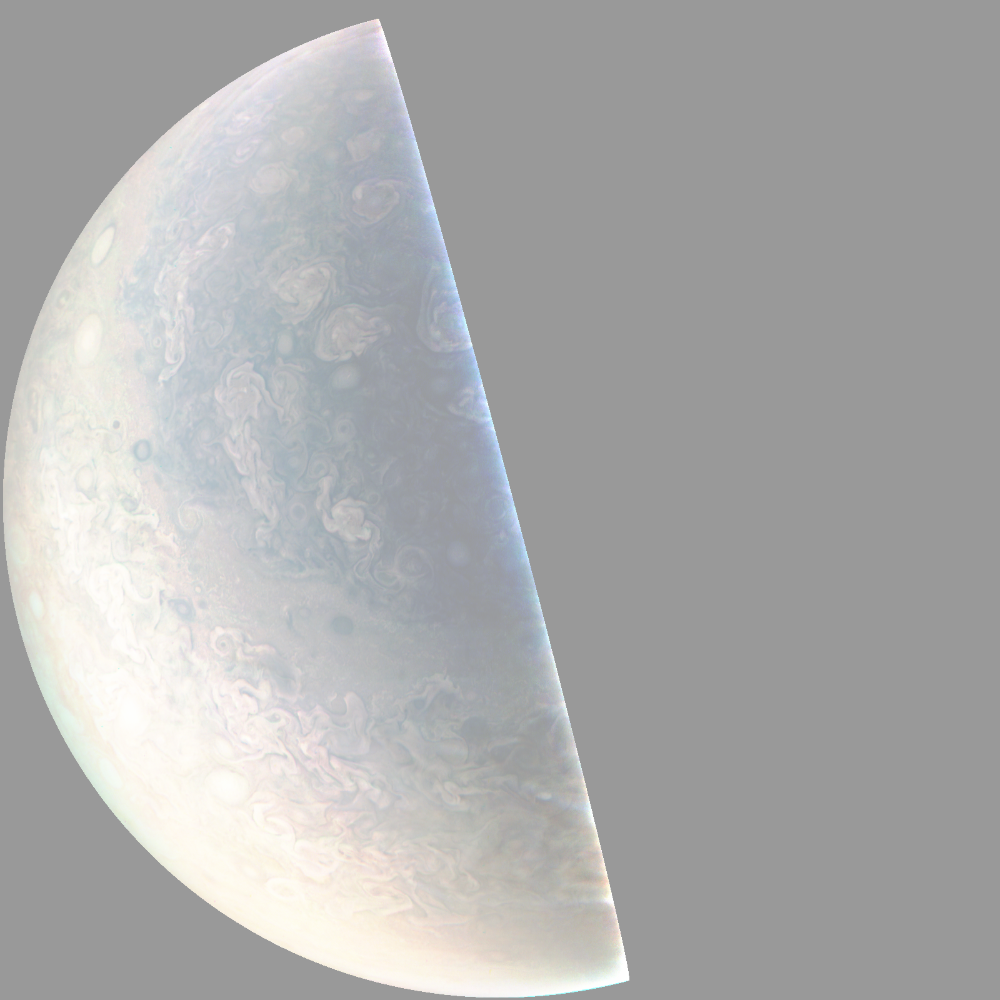

In [ ]:
import numpy as np
from skimage.exposure import equalize_hist

np_img = np.array(img)
type(np_img.shape) #numpy.ndarray (1600,1600, 3)
np_img = np.array(img)
contrast_img = equalize_hist(np_img)
contrast_img = (contrast_img * 255).astype(np.uint8)
#convert numpy to image and then show
pil_image = Image.fromarray(contrast_img)
#plt.imshow(contrast_img)
pil_image

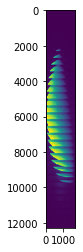

In [ ]:
striped_image = plt.imread("/content/JNCE_2017086_05C00105_V01-raw.png")

#Removal of any existing artifacts created by the strip acquisition process
plt.imshow(striped_image)

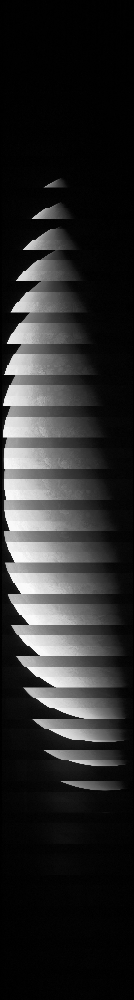

In [ ]:
#Instead of the preliminary RGB channel images, consider using raw framelets (striped images) to get the most useful information from JunoCam data
striped_image = Image.open("/content/JNCE_2017086_05C00105_V01-raw.png")

#Removal of any existing artifacts created by the strip acquisition process
striped_image


In [ ]:
#Alternative combinations of color channel images 